In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from scipy.spatial.distance import pdist, squareform
sns.set()

In [2]:
%matplotlib inline

In [3]:
NO_OF_NEIGHBORS = 25
# Dataset inside the training folder at https://osf.io/a6cwh/
DATASET = pd.read_csv('0'+
    str(NO_OF_NEIGHBORS) + "neighbors.csv",
    index_col=[0],
)


X_train, X_test, y_train, y_test = train_test_split(
    DATASET.drop("class", axis=1),
    DATASET["class"],
    test_size=0.1,  
    random_state=86,
)

In [4]:
NEIGH = KNeighborsClassifier(
    algorithm="ball_tree",
    leaf_size=10,
    metric="manhattan",
    metric_params=None,
    n_jobs=None,
    n_neighbors=5,
    p=2,
    weights="distance",
)
NEIGH.fit(X_train, y_train)
NEIGH.score(X_test, y_test)

0.9453703703703704

In [5]:
df0 = DATASET[DATASET['class']==0]
df1 = DATASET[DATASET['class']==1]
df2 = DATASET[DATASET['class']==2]

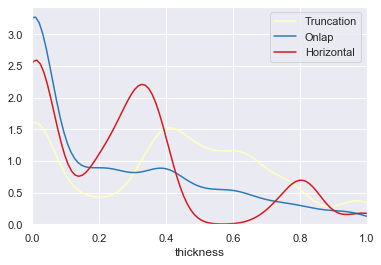

In [6]:
sns.distplot(df0.thickness, hist=False, color="#ffffbf", label='Truncation')
sns.distplot(df1.thickness, hist=False, color="#2c7bb6", label='Onlap')
sns.distplot(df2.thickness, hist=False, color="#d7191c", label='Horizontal')
plt.xlim(0,1)
plt.legend()


#sns.distplot(df['thickness natural log'], hist=False, color='green')
#sns.distplot(df['thickness power'], hist=False, color='green')

#sns.distplot(df1.thickness, hist=False, color='blue')
#sns.distplot(df1['thickness natural log'], hist=False, color='blue')
#sns.distplot(df1['thickness power'], hist=False, color='blue')

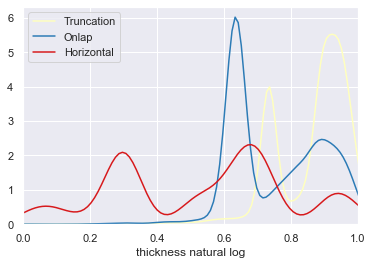

In [7]:
sns.distplot(df0['thickness natural log'], hist=False, color="#ffffbf", label='Truncation')
sns.distplot(df1['thickness natural log'], hist=False, color="#2c7bb6", label='Onlap')
sns.distplot(df2['thickness natural log'], hist=False, color="#d7191c", label='Horizontal')
plt.xlim(0,1)
plt.legend()

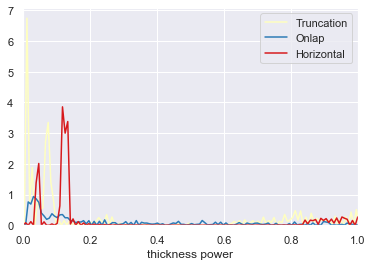

In [8]:
sns.distplot(df0['thickness power'], hist=False, color="#ffffbf", label='Truncation')
sns.distplot(df1['thickness power'], hist=False, color="#2c7bb6", label='Onlap')
sns.distplot(df2['thickness power'], hist=False, color="#d7191c", label='Horizontal')
plt.xlim(0,1)
plt.legend()

In [11]:
import shap
sub = shap.sample(X_test, 30)
shap.initjs()
sub

,thickness,thickness neighbor 1,thickness neighbor 2,thickness neighbor 3,thickness neighbor 4,thickness neighbor 5,thickness neighbor 6,thickness neighbor 7,thickness neighbor 8,thickness neighbor 9,...,thickness power neighbor 18,thickness power neighbor 19,thickness power neighbor 20,thickness power neighbor 21,thickness power neighbor 22,thickness power neighbor 23,thickness power neighbor 24,thickness power neighbor 25,x location,y location
354,0.007961,0.000000,0.000000,0.000000,0.000000,0.155374,0.152350,0.153941,0.000000,0.297000,...,0.000000,0.000003,6.348216e-10,0.000000e+00,4.453516e-11,1.095306e-03,0.000000e+00,7.067384e-09,0.816120,0.233082
335,0.501488,0.519228,0.429510,0.223866,0.232459,0.524077,0.544350,0.229959,0.617231,0.580358,...,0.000009,0.005525,1.593981e-02,3.851918e-07,3.910429e-07,3.561828e-07,2.722001e-02,4.504748e-03,0.324145,0.073549
193,0.818917,0.813359,0.063050,0.809577,0.071005,0.820407,0.809263,0.073043,0.804030,0.073175,...,0.128271,0.118635,1.180753e-01,1.221501e-01,1.170511e-01,1.270248e-01,1.136790e-01,1.180802e-01,0.281085,0.423468
209,0.668217,0.231504,0.234663,0.631107,0.733571,0.580229,0.618438,0.616012,0.570658,0.720284,...,0.001610,0.083293,5.077515e-07,8.370902e-02,8.593390e-02,4.808688e-02,4.077594e-02,4.738436e-07,0.365222,0.232371
293,0.359388,0.348998,0.360989,0.352680,0.354272,0.350062,0.229156,0.359911,0.347050,0.357616,...,0.000039,0.000040,2.746987e-05,2.619592e-05,2.631243e-05,2.494408e-05,5.314162e-07,2.598322e-07,0.742019,0.304071
326,0.857623,0.862082,0.113097,0.300116,0.038928,0.000000,0.239758,0.102048,0.421079,0.050142,...,0.000164,0.000000,1.164410e-04,2.692285e-01,2.236487e-01,1.904932e-03,1.345463e-04,2.491710e-01,0.634427,0.121199
314,0.383730,0.737889,0.379872,0.377220,0.376693,0.738059,0.376469,0.381273,0.375530,0.723027,...,0.000058,0.000073,6.090806e-05,5.499224e-05,5.696978e-05,6.008589e-05,7.480866e-05,5.868548e-05,0.380102,0.842447
93,0.232661,0.000000,0.038866,0.267600,0.280764,0.051445,0.083488,0.000000,0.000000,0.000000,...,0.000000,0.000000,5.263558e-07,1.640942e-15,0.000000e+00,0.000000e+00,0.000000e+00,9.481425e-07,0.617873,0.517738
160,0.000000,0.413634,0.401160,0.395233,0.387209,0.405923,0.390444,0.406977,0.408701,0.394211,...,0.000157,0.000159,1.083175e-10,1.112750e-04,1.127828e-04,1.607789e-04,1.371347e-04,9.276941e-05,0.506422,0.340593
182,0.759538,0.233427,0.247882,0.218517,0.358692,0.319922,0.400342,0.272550,0.392284,0.192742,...,0.069113,0.000037,7.187137e-02,3.578284e-04,1.393067e-06,3.596287e-04,1.592451e-03,1.059474e-09,0.274487,0.362419


In [ ]:
explainer = shap.KernelExplainer(NEIGH.predict_proba, X_train)
shap_values = explainer.shap_values(sub)
shap.force_plot(explainer.expected_value[0], shap_values[0], sub)

Using 9720 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


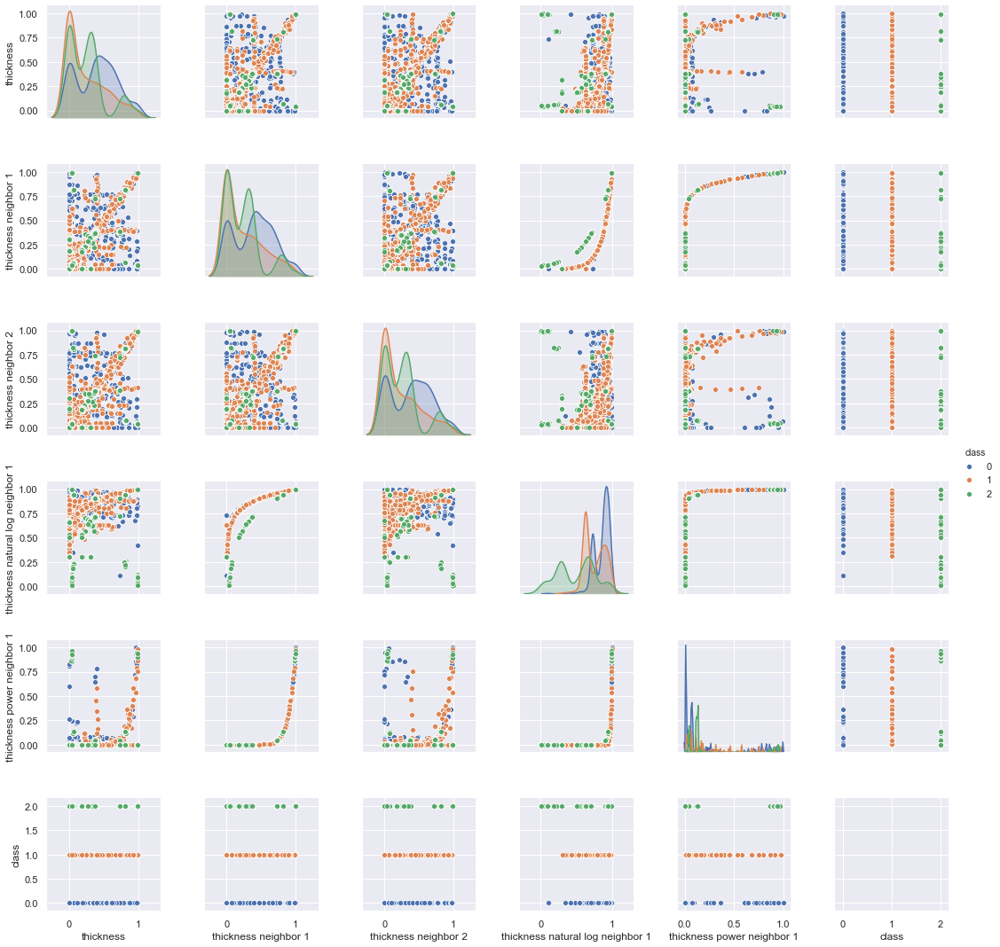

In [27]:
sub = DATASET.sample(2000)[['thickness', 'thickness neighbor 1','thickness neighbor 2',
                            'thickness natural log neighbor 1', 'thickness power neighbor 1',
                            'class']]
sns.pairplot(sub, hue='class')

In [62]:
import lime
import lime.lime_tabular
categorical_features = range(81)
categorical_names = [0,1,2]
feature_names = list(X_train.columns.values)

In [64]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
            training_labels=y_train, feature_names = feature_names,
            kernel_width=3, verbose=False)

predict_fn = lambda x: NEIGH.predict_proba(x)

In [74]:
np.random.seed(1)
for i in np.random.randint(0,10,10) :
    exp = explainer.explain_instance(X_test.values[i], predict_fn, num_features=80)
    exp.show_in_notebook(show_all=False)

In [73]:
np.random.randint(0,10,10) 

array([9, 5, 0, 0, 1, 7, 6, 9, 2, 4])